In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

        
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/open-problems-multimodal/sample_submission.csv
/kaggle/input/open-problems-multimodal/train_cite_targets.h5
/kaggle/input/open-problems-multimodal/metadata_cite_day_2_donor_27678.csv
/kaggle/input/open-problems-multimodal/test_multi_inputs.h5
/kaggle/input/open-problems-multimodal/evaluation_ids.csv
/kaggle/input/open-problems-multimodal/train_cite_inputs.h5
/kaggle/input/open-problems-multimodal/train_multi_targets.h5
/kaggle/input/open-problems-multimodal/train_multi_inputs.h5
/kaggle/input/open-problems-multimodal/metadata.csv
/kaggle/input/open-problems-multimodal/test_cite_inputs_day_2_donor_27678.h5
/kaggle/input/open-problems-multimodal/test_cite_inputs.h5


In [2]:
import os, gc, pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from colorama import Fore, Back, Style
from matplotlib.ticker import MaxNLocator
import warnings
warnings.simplefilter('ignore')
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, scale
from sklearn.decomposition import PCA
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.multioutput import MultiOutputRegressor
import lightgbm as lgb
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_squared_error

DATA_DIR = "/kaggle/input/open-problems-multimodal/"
FP_CELL_METADATA = os.path.join(DATA_DIR,"metadata.csv")

FP_CITE_TRAIN_INPUTS = os.path.join(DATA_DIR,"train_cite_inputs.h5")
FP_CITE_TRAIN_TARGETS = os.path.join(DATA_DIR,"train_cite_targets.h5")
FP_CITE_TEST_INPUTS = os.path.join(DATA_DIR,"test_cite_inputs.h5")

FP_MULTIOME_TRAIN_INPUTS = os.path.join(DATA_DIR,"train_multi_inputs.h5")
FP_MULTIOME_TRAIN_TARGETS = os.path.join(DATA_DIR,"train_multi_targets.h5")
FP_MULTIOME_TEST_INPUTS = os.path.join(DATA_DIR,"test_multi_inputs.h5")

FP_SUBMISSION = os.path.join(DATA_DIR,"sample_submission.csv")
FP_EVALUATION_IDS = os.path.join(DATA_DIR,"evaluation_ids.csv")

In [3]:
!pip install --quiet tables

In [4]:
df_cell = pd.read_csv(FP_CELL_METADATA)
df_cell_cite = df_cell[df_cell.technology=="citeseq"]
df_cell_multi = df_cell[df_cell.technology=="multiome"]
df_cell_cite.shape, df_cell_multi.shape

((119651, 5), (161877, 5))

(70988, 22050)
(70988, 21601)
(70988, 11601)


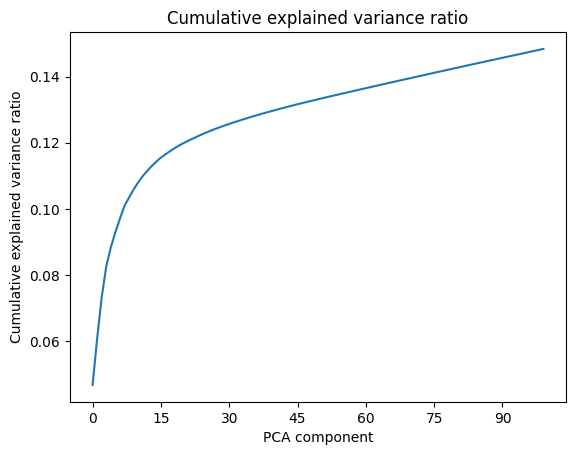

(70988, 100)
(70988, 140)
CPU times: user 1min 56s, sys: 14.7 s, total: 2min 11s
Wall time: 1min 21s


In [5]:
%%time
# Preprocessing
col_start = 10000

class PreprocessCiteseq(BaseEstimator, TransformerMixin):
    columns_to_use = 13000
    
    @staticmethod
    def take_column_subset(X):
        return X[:,-(PreprocessCiteseq.columns_to_use+col_start):-col_start]
    
    def transform(self, X):
        print(X.shape)
        X = X[:,~self.all_zero_columns]
        print(X.shape)
        X = PreprocessCiteseq.take_column_subset(X) # use only a part of the columns
        print(X.shape)
        gc.collect()

        X = self.pca.transform(X)
        print(X.shape)
        return X

    def fit_transform(self, X):
        gc.collect()
        print(X.shape)
        self.all_zero_columns = (X == 0).all(axis=0)
        X = X[:,~self.all_zero_columns]
        print(X.shape)
        X = PreprocessCiteseq.take_column_subset(X) # use only a part of the columns
        print(X.shape)
        gc.collect()

        self.pca = PCA(n_components=100, copy=False, random_state=1)
        X = self.pca.fit_transform(X)
        plt.plot(self.pca.explained_variance_ratio_.cumsum())
        plt.title("Cumulative explained variance ratio")
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
        plt.xlabel('PCA component')
        plt.ylabel('Cumulative explained variance ratio')
        plt.show()
        print(X.shape)
        return X

preprocessor = PreprocessCiteseq()

cite_train_x = None
cite_train_x = preprocessor.fit_transform(pd.read_hdf(FP_CITE_TRAIN_INPUTS).values)

cite_train_y = pd.read_hdf(FP_CITE_TRAIN_TARGETS).values
print(cite_train_y.shape)

In [6]:
pip install lightgbm xgboost catboost scikit-learn 


Note: you may need to restart the kernel to use updated packages.


In [7]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
import gc

# Function to train and evaluate a model
def train_and_evaluate_model(model, train_x, train_y):
    model.fit(train_x, train_y)
    y_pred = model.predict(train_x)
    mse = mean_squared_error(train_y, y_pred)
    return mse, model

# Placeholder for training data
# cite_train_x and cite_train_y should be your actual training data
# For demonstration purposes, assume they are already loaded

model = KNeighborsRegressor(n_neighbors=5)

print('Training K-Nearest Neighbors model...')
mse, trained_model = train_and_evaluate_model(model, cite_train_x, cite_train_y)
print(f'K-Nearest Neighbors MSE: {mse}')

# Clean up to free memory
gc.collect()


Training K-Nearest Neighbors model...
K-Nearest Neighbors MSE: 2.0053088665008545


0

In [8]:
from sklearn.metrics import r2_score

In [9]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
import gc

# Function to train and evaluate a model
def train_and_evaluate_model(model, train_x, train_y):
    model.fit(train_x, train_y)
    y_pred = model.predict(train_x)
    r2_scores = r2_score(train_y, y_pred, multioutput='raw_values')
    r2_total = r2_score(train_y, y_pred)
    mse =mean_squared_error(train_y, y_pred, multioutput='raw_values')
    mse_total =mean_squared_error(train_y, y_pred)
    return r2_scores, r2_total, mse, mse_total, model

# Placeholder for training data
# cite_train_x and cite_train_y should be your actual training data
# For demonstration purposes, assume they are already loaded

model = KNeighborsRegressor(n_neighbors=5, metric='manhattan')

print('Training K-Nearest Neighbors model...')
r2_scores, r2_total, mse, mse_total, trained_model = train_and_evaluate_model(model, cite_train_x, cite_train_y)

# Print R2 scores for each target
for i, r2 in enumerate(r2_scores):
    print(f'R^2 Score for Target {i}: {r2}')
for i, mse in enumerate(mse):
    print(f'R^2 Score for Target {i}: {mse}')
print('R^2 score total:', r2_total)
print('MSE total :', mse_total)
# Clean up to free memory
gc.collect()


Training K-Nearest Neighbors model...
R^2 Score for Target 0: 0.3555454132134541
R^2 Score for Target 1: 0.2607404066524569
R^2 Score for Target 2: 0.31373893748682935
R^2 Score for Target 3: 0.5597549539520026
R^2 Score for Target 4: 0.6652995050941077
R^2 Score for Target 5: 0.5707669777827669
R^2 Score for Target 6: 0.7356238928461281
R^2 Score for Target 7: 0.3281444335889664
R^2 Score for Target 8: 0.34105683958395094
R^2 Score for Target 9: 0.41727149829474364
R^2 Score for Target 10: 0.21493768204637098
R^2 Score for Target 11: 0.22313375443212746
R^2 Score for Target 12: 0.24439233964793305
R^2 Score for Target 13: 0.3000716374689688
R^2 Score for Target 14: 0.5463067611999146
R^2 Score for Target 15: 0.4568174824693396
R^2 Score for Target 16: 0.5747919335509493
R^2 Score for Target 17: 0.6751531647178199
R^2 Score for Target 18: 0.5575761057538106
R^2 Score for Target 19: 0.20381753060801977
R^2 Score for Target 20: 0.3372819075853315
R^2 Score for Target 21: 0.65398590751461

0

In [10]:
import lightgbm as lgb
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score, mean_squared_error
import gc

# Function to train and evaluate a model
def train_and_evaluate_model(model, train_x, train_y):
    model.fit(train_x, train_y)
    y_pred = model.predict(train_x)
    r2_scores = r2_score(train_y, y_pred, multioutput='raw_values')
    mse_scores = mean_squared_error(train_y, y_pred, multioutput='raw_values')
    r2_total = r2_score(train_y, y_pred)
    mse_total = mean_squared_error(train_y, y_pred)
    return r2_scores, r2_total, mse_scores, mse_total, model

params = {
    'n_estimators': 1000,
    'learning_rate': 0.1, 
    'metric': 'mae', 
    "seed": 42,
    'reg_alpha': 0.0014, 
    'reg_lambda': 0.2, 
    'colsample_bytree': 0.8, 
    'subsample': 0.5, 
    'max_depth': 10, 
    'num_leaves': 722, 
    'min_child_samples': 83,
}

# Initialize LightGBM regressor
lgb_model = lgb.LGBMRegressor(**params)

# Wrap LightGBM model in MultiOutputRegressor for multi-output support
multi_output_model = MultiOutputRegressor(lgb_model)

print('Training LightGBM model for multi-output...')
r2_scores, r2_total, mse_scores, mse_total, trained_model = train_and_evaluate_model(multi_output_model, cite_train_x, cite_train_y)

# Print R2 scores and MSE for each target
for i, r2 in enumerate(r2_scores):
    print(f'R^2 Score for Target {i}: {r2}')
    print(f'MSE for Target {i}: {mse_scores[i]}')

print('R^2 score total:', r2_total)
print('MSE total :', mse_total)

# Clean up to free memory
gc.collect()


Training LightGBM model for multi-output...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 25500
[LightGBM] [Info] Number of data points in the train set: 70988, number of used features: 100
[LightGBM] [Info] Start training from score 0.454768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

430

In [11]:
import xgboost as xgb
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score, mean_squared_error
import gc

# Function to train and evaluate a model
def train_and_evaluate_model(model, train_x, train_y):
    model.fit(train_x, train_y)
    y_pred = model.predict(train_x)
    r2_scores = r2_score(train_y, y_pred, multioutput='raw_values')
    mse_scores = mean_squared_error(train_y, y_pred, multioutput='raw_values')
    r2_total = r2_score(train_y, y_pred)
    mse_total = mean_squared_error(train_y, y_pred)
    return r2_scores, r2_total, mse_scores, mse_total, model

# Placeholder for training data
# cite_train_x and cite_train_y should be your actual training data
# For demonstration purposes, assume they are already loaded

# Define XGBoost parameters
params = {

    'n_estimators': 1000,
    'learning_rate': 0.1,
    # Add more parameters as needed
}
params = {
    'n_estimators': 1000,
    'learning_rate': 0.1,
    'objective': 'reg:squarederror',  # for regression task
    'eval_metric': 'mae', 
    "seed": 42,
    'reg_alpha': 0.0014, 
    'reg_lambda': 0.2, 
    'colsample_bytree': 0.8, 
    'subsample': 0.5, 
    'max_depth': 10, 
    'min_child_weight': 83,
}

# Initialize XGBoost regressor
xgb_model = xgb.XGBRegressor(**params)

# Wrap XGBoost model in MultiOutputRegressor for multi-output support
multi_output_model = MultiOutputRegressor(xgb_model)

print('Training XGBoost model for multi-output...')
r2_scores, r2_total, mse_scores, mse_total, trained_model = train_and_evaluate_model(multi_output_model, cite_train_x, cite_train_y)

# Print R2 scores and MSE for each target
for i, r2 in enumerate(r2_scores):
    print(f'R^2 Score for Target {i}: {r2}')
    print(f'MSE for Target {i}: {mse_scores[i]}')

print('R^2 score total:', r2_total)
print('MSE total :', mse_total)

# Clean up to free memory
gc.collect()


Training XGBoost model for multi-output...
R^2 Score for Target 0: 0.9063153546756416
MSE for Target 0: 0.18202973902225494
R^2 Score for Target 1: 0.9580940694963316
MSE for Target 1: 0.03352653235197067
R^2 Score for Target 2: 0.9630756763054855
MSE for Target 2: 0.031474657356739044
R^2 Score for Target 3: 0.9783933506260665
MSE for Target 3: 0.13970275223255157
R^2 Score for Target 4: 0.9837971996909526
MSE for Target 4: 0.06763330101966858
R^2 Score for Target 5: 0.9781740661147049
MSE for Target 5: 0.28180116415023804
R^2 Score for Target 6: 0.9855774909824087
MSE for Target 6: 0.4101463854312897
R^2 Score for Target 7: 0.9433920015414357
MSE for Target 7: 0.0630158856511116
R^2 Score for Target 8: 0.9652499709112632
MSE for Target 8: 0.025605199858546257
R^2 Score for Target 9: 0.9659014466524796
MSE for Target 9: 0.05293381214141846
R^2 Score for Target 10: 0.954074711918515
MSE for Target 10: 0.03294658660888672
R^2 Score for Target 11: 0.953927619831327
MSE for Target 11: 0.0

106

In [12]:
from catboost import CatBoostRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score, mean_squared_error
import gc

# Function to train and evaluate a model
def train_and_evaluate_model(model, train_x, train_y):
    model.fit(train_x, train_y)
    y_pred = model.predict(train_x)
    r2_scores = r2_score(train_y, y_pred, multioutput='raw_values')
    mse_scores = mean_squared_error(train_y, y_pred, multioutput='raw_values')
    r2_total = r2_score(train_y, y_pred)
    mse_total = mean_squared_error(train_y, y_pred)
    return r2_scores, r2_total, mse_scores, mse_total, model

# Define CatBoost parameters
params = {
    'iterations': 1000,             # equivalent to n_estimators
    'learning_rate': 0.1,
    'loss_function': 'MAE',         # equivalent to eval_metric
    'random_seed': 42,
    'l2_leaf_reg': 0.2,             # regularization parameter
    'depth': 10,                    # equivalent to max_depth
    'rsm': 0.8,                     # equivalent to colsample_bytree
    'subsample': 0.5,
    'min_data_in_leaf': 83,         # equivalent to min_child_samples
    'bagging_temperature': 1,       # bagging parameter
    'random_strength': 1,           # used to control the amount of randomness
    'one_hot_max_size': 2,          # for categorical features
    'leaf_estimation_method': 'Newton', # estimation method for leaf values
}
# Initialize CatBoost regressor
catboost_model = CatBoostRegressor(**params)

# Wrap CatBoost model in MultiOutputRegressor for multi-output support
multi_output_catboost = MultiOutputRegressor(catboost_model)

print('Training CatBoost model with MultiOutputRegressor...')
r2_scores, r2_total, mse_scores, mse_total, trained_model = train_and_evaluate_model(multi_output_catboost, cite_train_x, cite_train_y)

# Print R2 scores and MSE for each target
for i, r2 in enumerate(r2_scores):
    print(f'R^2 Score for Target {i}: {r2}')
    print(f'MSE for Target {i}: {mse_scores[i]}')

print('R^2 score total:', r2_total)
print('MSE total :', mse_total)

# Clean up to free memory
gc.collect()


Training CatBoost model with MultiOutputRegressor...


CatBoostError: /src/catboost/catboost/private/libs/options/catboost_options.cpp:597: Newton leaves estimation method is not supoprted for MAE loss function